# TBBR Images + Annotations visualizer

Working directories and requirements

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import json
import yaml
import matplotlib.patches as patches
from pathlib import Path
from PIL import Image
import random

numpy_file_path = r"./data/thermalnumpy/train/images/Flug1_100/DJI_0047_R.npy"  # Example TBBR image file path

media_folder = 'Flug1_105'
coco_path = r'./data/thermalbg/test/Flug1_105Media_coco.json'

dataset_dir = Path(r"./data/thermal_yolo")
yaml_file = dataset_dir / "dataset.yaml"

### Original file format: .npy images and .json annotations

Shape dell'array: (2680, 3370, 5)
Tipo di dati: uint8


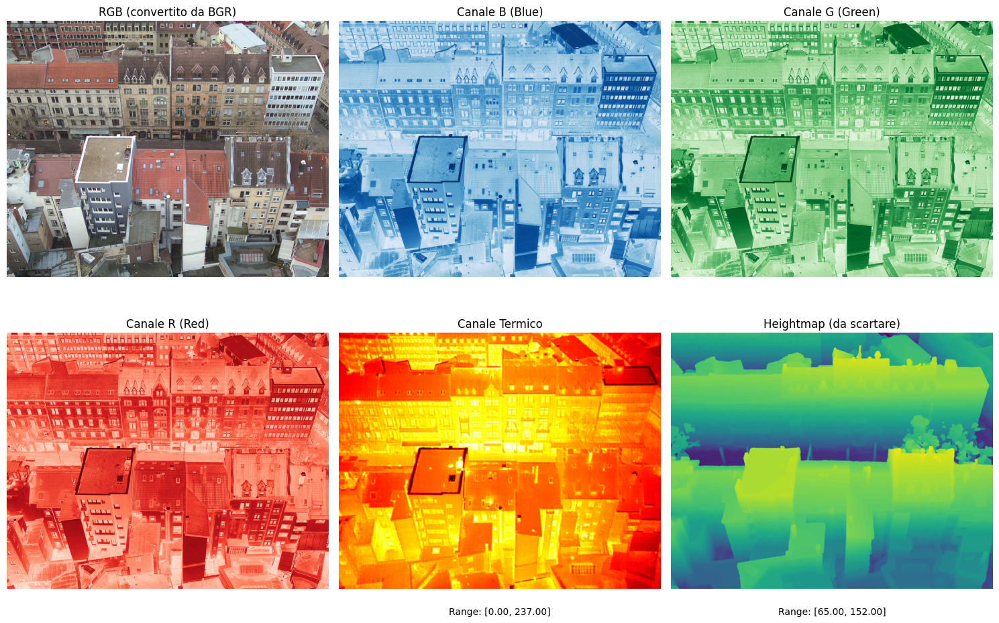


Statistiche:
BGR range: [0.00, 255.00]
Thermal range: [0.00, 237.00]
Heightmap range: [65.00, 152.00]


In [ ]:
data = np.load(numpy_file_path)

print(f"Array Shape: {data.shape}")
print(f"Type of data: {data.dtype}")

# Extract the various channels
# Assuming the structure is (height, width, 5) where:
# [:, :, 0:3] = BGR
# [:, :, 3] = Thermal
# [:, :, 4] = Heightmap

bgr = data[:, :, 0:3]  # BGR channels
thermal = data[:, :, 3]  # Thermal channel
heightmap = data[:, :, 4]  # Heightmap channel

# Convert BGR to RGB for correct visualization
rgb = bgr[:, :, ::-1]  # Reverse the channel order

# Visualize the channels
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# RGB
axes[0, 0].imshow(rgb.astype(np.uint8))
axes[0, 0].set_title('RGB (convertito da BGR)')
axes[0, 0].axis('off')

# Separate BGR channels
axes[0, 1].imshow(bgr[:, :, 0], cmap='Blues')
axes[0, 1].set_title('Blue Channel')
axes[0, 1].axis('off')

axes[0, 2].imshow(bgr[:, :, 1], cmap='Greens')
axes[0, 2].set_title('Green Channel')
axes[0, 2].axis('off')

axes[1, 0].imshow(bgr[:, :, 2], cmap='Reds')
axes[1, 0].set_title('Red Channel')
axes[1, 0].axis('off')

# Thermal
axes[1, 1].imshow(thermal, cmap='hot')
axes[1, 1].set_title('Thermal Channel')
axes[1, 1].axis('off')
axes[1, 1].text(0.5, -0.1, f'Range: [{thermal.min():.2f}, {thermal.max():.2f}]', 
                ha='center', transform=axes[1, 1].transAxes)

# Heightmap
axes[1, 2].imshow(heightmap, cmap='viridis')
axes[1, 2].set_title('Heightmap')
axes[1, 2].axis('off')
axes[1, 2].text(0.5, -0.1, f'Range: [{heightmap.min():.2f}, {heightmap.max():.2f}]', 
                ha='center', transform=axes[1, 2].transAxes)

plt.tight_layout()
plt.show()

print(f"\nStatistics:")
print(f"BGR range: [{bgr.min():.2f}, {bgr.max():.2f}]")
print(f"Thermal range: [{thermal.min():.2f}, {thermal.max():.2f}]")
print(f"Heightmap range: [{heightmap.min():.2f}, {heightmap.max():.2f}]")

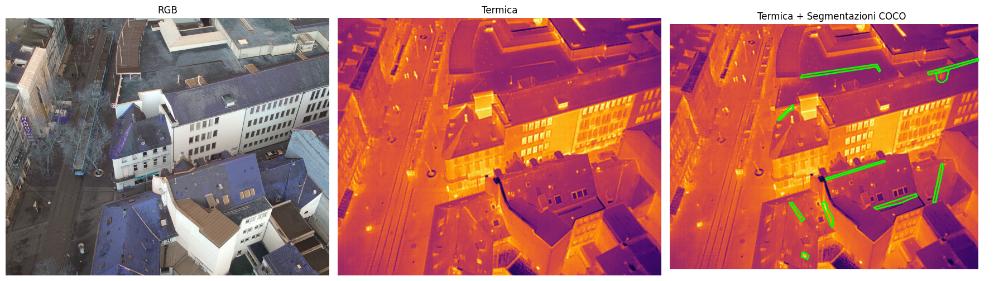

In [ ]:
arr = np.load(numpy_file_path)

with open(coco_path, 'r') as f:
    coco = json.load(f)

base_name = f"{media_folder}/{os.path.basename(numpy_file_path)}"
img_info = next((img for img in coco['images'] if img['file_name'] == base_name), None)
anns = []
if img_info is not None:
    img_id = img_info['id']
    anns = [ann for ann in coco['annotations'] if ann['image_id'] == img_id]

plt.figure(figsize=(18,6))
# RGB
plt.subplot(1,3,1)
plt.imshow(arr[...,:3].astype(np.uint8))
plt.title('RGB')
plt.axis('off')
# Thermal
if arr.shape[2] > 3:
    plt.subplot(1,3,2)
    plt.imshow(arr[...,3], cmap='inferno')
    plt.title('Thermal')
    plt.axis('off')
    # Thermal + segmentations
    plt.subplot(1,3,3)
    plt.imshow(arr[...,3], cmap='inferno')
    for ann in anns:
        if 'segmentation' in ann and isinstance(ann['segmentation'], list):
            for seg in ann['segmentation']:
                poly = np.array(seg).reshape((-1,2))
                plt.plot(poly[:,0], poly[:,1], color='lime', linewidth=2)
    plt.title('Thermal + COCO Segmentations')
    plt.axis('off')
else:
    plt.subplot(1,3,2)
    plt.text(0.5,0.5,'No thermal channel',ha='center',va='center')
    plt.axis('off')
    plt.subplot(1,3,3)
    plt.text(0.5,0.5,'No thermal channel',ha='center',va='center')
    plt.axis('off')
plt.tight_layout()
plt.show()

### New yolo compatible file format: .tiff images and .txt annotations

Run the following cell:

In [ ]:
with open(yaml_file, 'r') as f:
    dataset_config = yaml.safe_load(f)

print(f"\nDataset parameters:")
print(f"   Path: {dataset_config['path']}")
print(f"   Channels: {dataset_config.get('ch', 3)}")
print(f"   Classes: {dataset_config['nc']}")
print(f"   Names: {dataset_config['names']}")

# Directory immagini e labels
train_images_dir = dataset_dir / "train" / "images"
train_labels_dir = dataset_dir / "train" / "labels"

# Trova tutti i file
image_files = sorted(list(train_images_dir.glob("*.tiff")))
print(f"\nFound {len(image_files)} training images")

def load_tiff_4channel(tiff_path):
    """Load TIFF with 4 channels"""
    try:
        import tifffile
        data = tifffile.imread(tiff_path)
    except ImportError:
        img = Image.open(tiff_path)
        data = np.array(img)
    return data

def load_yolo_labels(label_path):
    """Load YOLO labels from txt file"""
    if not label_path.exists():
        return []
    
    labels = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) > 0:
                class_id = int(parts[0])
                coords = [float(x) for x in parts[1:]]
                labels.append({
                    'class_id': class_id,
                    'coords': coords,
                    'is_segmentation': len(coords) > 4  # Segmentation has more than 4 values
                })
    return labels

def denormalize_bbox(bbox_norm, img_width, img_height):
    """Convert normalized YOLO bbox to pixel coordinates"""
    x_center, y_center, width, height = bbox_norm
    x_center_px = x_center * img_width
    y_center_px = y_center * img_height
    width_px = width * img_width
    height_px = height * img_height
    
    # Calculate top-left corner
    x1 = x_center_px - width_px / 2
    y1 = y_center_px - height_px / 2
    
    return x1, y1, width_px, height_px

def denormalize_segmentation(seg_norm, img_width, img_height):
    """Convert normalized YOLO segmentation points to pixel coordinates"""
    points = []
    for i in range(0, len(seg_norm), 2):
        x = seg_norm[i] * img_width
        y = seg_norm[i + 1] * img_height
        points.append([x, y])
    return np.array(points)

def visualize_sample(image_path, num_samples=3):
    """Visualize random samples from the dataset"""
    
    # Select random samples
    sample_images = random.sample(image_files, min(num_samples, len(image_files)))
    
    for img_path in sample_images:
        print(f"\n{'='*80}")
        print(f"Image: {img_path.name}")
        print(f"{'='*80}")
        
        # Load TIFF image (4 channels)
        data = load_tiff_4channel(img_path)
        print(f"Shape: {data.shape}, Dtype: {data.dtype}")
        
        if data.shape[0] != 4:
            print(f"Warning: Unexpected shape {data.shape}, expected (4, H, W)")
            continue
        
        height, width = data.shape[1], data.shape[2]
        
        # Load labels
        label_path = train_labels_dir / img_path.name.replace('.tiff', '.txt')
        labels = load_yolo_labels(label_path)
        print(f"Annotations: {len(labels)}")
        
        for i, label in enumerate(labels[:3]):
            class_name = dataset_config['names'][label['class_id']]
            label_type = "Segmentation" if label['is_segmentation'] else "BBox"
            print(f"   {i+1}. Class: {class_name} ({label_type})")
        
        # Prepare visualization
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle(f'{img_path.name}', fontsize=14, fontweight='bold')
        
        # 1. RGB (from BGR)
        rgb = data[[2, 1, 0], :, :]  # Invert BGR → RGB
        rgb_img = np.transpose(rgb, (1, 2, 0)).astype(np.uint8)
        
        axes[0, 0].imshow(rgb_img)
        axes[0, 0].set_title('RGB (from BGR)', fontsize=12)
        axes[0, 0].axis('off')
        
        # 2. RGB with Annotations (Segmentation + BBox)
        axes[0, 1].imshow(rgb_img)
        axes[0, 1].set_title(f'RGB + Segmentation + BBox ({len(labels)} objects)', fontsize=12)
        axes[0, 1].axis('off')
        
        # Colors for classes
        colors = plt.cm.tab10(np.linspace(0, 1, len(dataset_config['names'])))
        
        for label in labels:
            class_id = label['class_id']
            class_name = dataset_config['names'][class_id]
            color = colors[class_id]
            
            if label['is_segmentation']:
                # Draw polygon (segmentation)
                seg_points = denormalize_segmentation(label['coords'], width, height)
                polygon = patches.Polygon(seg_points, linewidth=2, 
                                         edgecolor=color, facecolor='none', 
                                         linestyle='-', label=class_name)
                axes[0, 1].add_patch(polygon)
                
                # Calculate and draw bounding box from polygon
                min_x = seg_points[:, 0].min()
                max_x = seg_points[:, 0].max()
                min_y = seg_points[:, 1].min()
                max_y = seg_points[:, 1].max()
                bbox_width = max_x - min_x
                bbox_height = max_y - min_y
                
                rect = patches.Rectangle((min_x, min_y), bbox_width, bbox_height, 
                                        linewidth=1.5, edgecolor=color, 
                                        facecolor='none', linestyle='--', alpha=0.7)
                axes[0, 1].add_patch(rect)
            else:
                # Draw bbox
                x1, y1, w, h = denormalize_bbox(label['coords'], width, height)
                rect = patches.Rectangle((x1, y1), w, h, linewidth=2,
                                        edgecolor=color, facecolor='none',
                                        label=class_name)
                axes[0, 1].add_patch(rect)
        
        # Add legend (remove duplicates)
        handles, labels_text = axes[0, 1].get_legend_handles_labels()
        by_label = dict(zip(labels_text, handles))
        if by_label:
            axes[0, 1].legend(by_label.values(), by_label.keys(), 
                            loc='upper right', fontsize=8)
        
        # 3. Thermal Channel
        thermal = data[3]
        im_thermal = axes[1, 0].imshow(thermal, cmap='hot')
        axes[1, 0].set_title('Thermal Channel', fontsize=12)
        axes[1, 0].axis('off')
        plt.colorbar(im_thermal, ax=axes[1, 0], fraction=0.046, pad=0.04)
        
        # 4. Thermal with Annotations (Segmentation + BBox)
        axes[1, 1].imshow(thermal, cmap='hot', alpha=0.7)
        axes[1, 1].set_title(f'Thermal + Segmentation + BBox', fontsize=12)
        axes[1, 1].axis('off')
        
        for label in labels:
            class_id = label['class_id']
            class_name = dataset_config['names'][class_id]
            color = colors[class_id]
            
            if label['is_segmentation']:
                # Draw polygon (segmentation)
                seg_points = denormalize_segmentation(label['coords'], width, height)
                polygon = patches.Polygon(seg_points, linewidth=2, 
                                         edgecolor=color, facecolor='none',
                                         linestyle='-')
                axes[1, 1].add_patch(polygon)
                
                # Calculate and draw bounding box from polygon
                min_x = seg_points[:, 0].min()
                max_x = seg_points[:, 0].max()
                min_y = seg_points[:, 1].min()
                max_y = seg_points[:, 1].max()
                bbox_width = max_x - min_x
                bbox_height = max_y - min_y
                
                rect = patches.Rectangle((min_x, min_y), bbox_width, bbox_height, 
                                        linewidth=1.5, edgecolor=color, 
                                        facecolor='none', linestyle='--', alpha=0.7)
                axes[1, 1].add_patch(rect)
            else:
                # Draw bbox
                x1, y1, w, h = denormalize_bbox(label['coords'], width, height)
                rect = patches.Rectangle((x1, y1), w, h, linewidth=2,
                                        edgecolor=color, facecolor='none')
                axes[1, 1].add_patch(rect)
        
        plt.tight_layout()
        plt.show()


VISUALIZZAZIONE CAMPIONI

Immagine: Flug1_104_DJI_0479_R.tiff
Shape: (4, 2680, 3370), Dtype: uint8
Annotazioni: 4
   1. Classe: Thermal bridge (Segmentation)
   2. Classe: Thermal bridge (Segmentation)
   3. Classe: Thermal bridge (Segmentation)


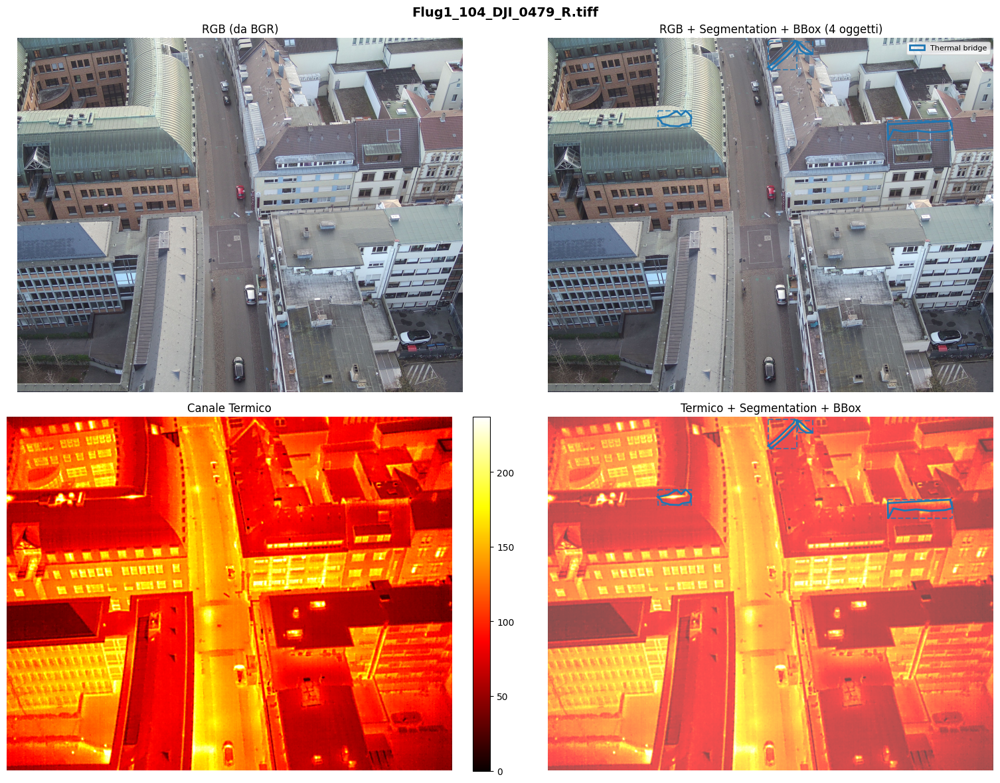


Immagine: Flug1_103_DJI_0896_R.tiff
Shape: (4, 2680, 3370), Dtype: uint8
Annotazioni: 5
   1. Classe: Thermal bridge (Segmentation)
   2. Classe: Thermal bridge (Segmentation)
   3. Classe: Thermal bridge (Segmentation)


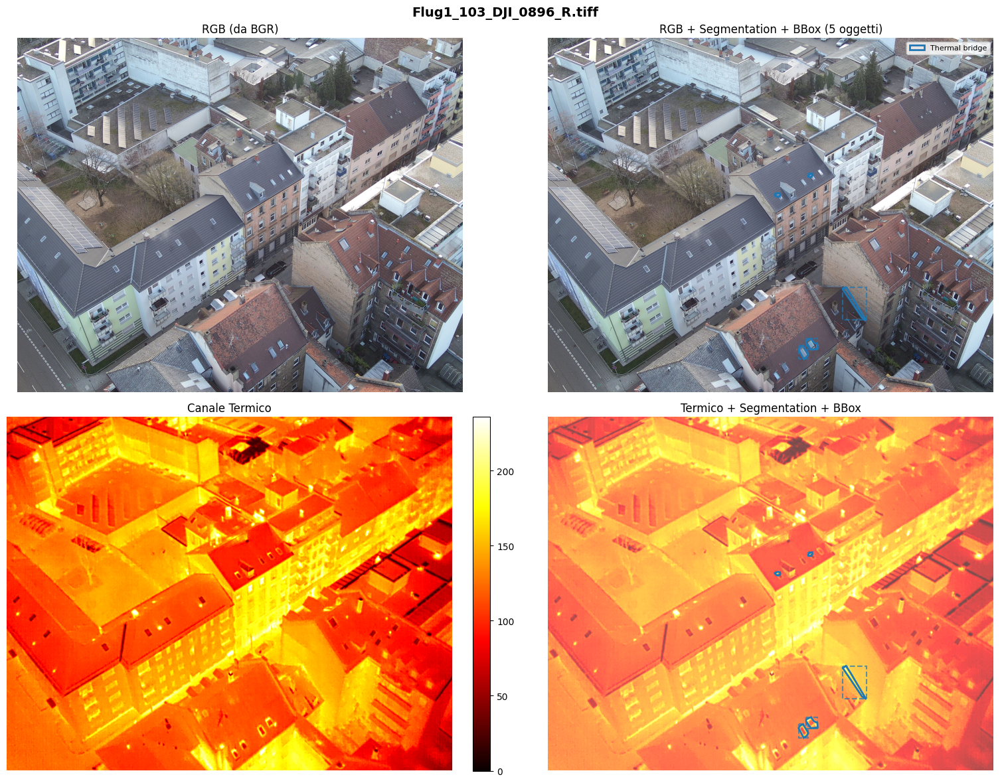


Immagine: Flug1_104_DJI_0809_R.tiff
Shape: (4, 2680, 3370), Dtype: uint8
Annotazioni: 7
   1. Classe: Thermal bridge (Segmentation)
   2. Classe: Thermal bridge (Segmentation)
   3. Classe: Thermal bridge (Segmentation)


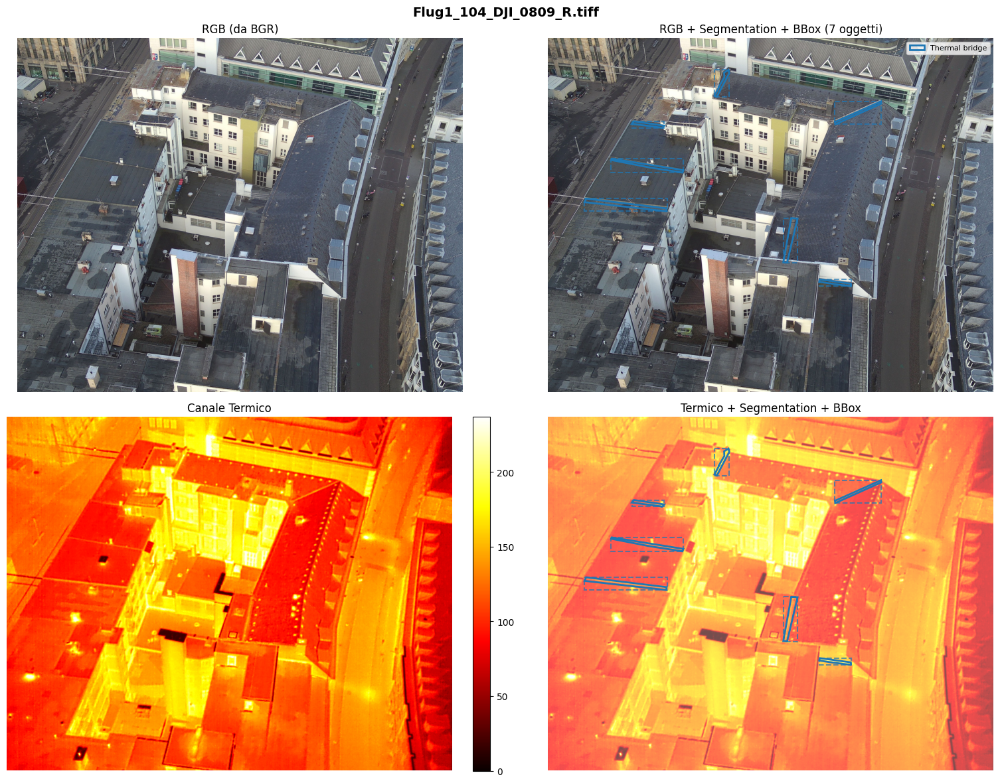

In [ ]:
visualize_sample(image_files, num_samples=3)